# Fake News Classifier — Inference + Explainability Notebook

**Dual-signal classifier:** RoBERTa (semantic) + GPT-2 (statistical) -> Fusion Head

| Phase | Model | Description |
|-------|-------|-------------|
| **1** | RoBERTa-base (fine-tuned) | Semantic classification only |
| **2** | RoBERTa + GPT-2 -> Fusion Head | Full dual-signal pipeline |

### Explainability Methods Covered

| Section | Method | What it explains | Best for |
|---------|--------|-----------------|----------|
| **12** | **LIME** | Token importance via perturbation | Quick word-level highlights, both phases |
| **13** | **SHAP** | Shapley attribution on Fusion Head inputs | Semantic vs stat signal decomposition |
| **14** | **Integrated Gradients** (Captum) | Gradient path attribution per token | Precise, axiomatically-grounded token scores |
| **15** | **Attention Visualisation** | RoBERTa attention head heatmap | CLS attention patterns across layers |
| **16** | **explain_all()** | All four methods in one call | Full explanation in one shot |

---

## 1. Setup & Imports

In [1]:
import os
import gc
import warnings
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.notebook import tqdm
from IPython.display import display, HTML
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score, classification_report,
)

warnings.filterwarnings('ignore')
os.environ['TOKENIZERS_PARALLELISM'] = 'false'

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {DEVICE}')
if DEVICE.type == 'cuda':
    print(f'  GPU : {torch.cuda.get_device_name(0)}')
    print(f'  VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB')

Using device: cuda
  GPU : NVIDIA GeForce RTX 4060 Laptop GPU
  VRAM: 8.6 GB


In [2]:
import transformers
import tokenizers
print(transformers.__version__)
print(tokenizers.__version__)

4.40.0
0.19.1


## 2. Configuration

In [3]:
import os
from transformers import RobertaTokenizer

PHASE1_BEST_DIR = r"H:\CSET312_project\v3\models\phase1_roberta_fulltune\best"
   
print("Files before:", os.listdir(PHASE1_BEST_DIR))

# This adds the missing vocab.json and merges.txt
base_tokenizer = RobertaTokenizer.from_pretrained("roberta-base")
base_tokenizer.save_pretrained(PHASE1_BEST_DIR)

print("\nFiles after:", sorted(os.listdir(PHASE1_BEST_DIR)))

Files before: ['config.json', 'model.safetensors', 'tokenizer.json', 'tokenizer_config.json']


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]


Files after: ['config.json', 'merges.txt', 'model.safetensors', 'special_tokens_map.json', 'tokenizer.json', 'tokenizer_config.json', 'vocab.json']


In [4]:
PHASE1_BEST_DIR = 'H:\\CSET312_project\\v3\\models\\phase1_roberta_fulltune\\best'
PHASE2_HEAD_PT  = 'H:\\CSET312_project\\v3\\models\\phase2_fusion_head\\fusion_head.pt'
GPT2_NAME       = 'gpt2'

MAX_LENGTH   = 512
BATCH_SIZE   = 32
SEMANTIC_DIM = 768
STAT_DIM     = 3
HIDDEN_DIM   = 128
DROPOUT      = 0.50

ID2LABEL   = {0: 'REAL', 1: 'FAKE'}
STAT_NAMES = ['gpt2_loss', 'sent_var', 'neg_gpt2_loss']

print('Configuration set.')

Configuration set.


## 3. Model Definitions

In [5]:
class FusionHead(nn.Module):
    """Must exactly match architecture in train.py."""
    def __init__(self, semantic_dim=SEMANTIC_DIM, stat_dim=STAT_DIM,
                 hidden=HIDDEN_DIM, dropout=DROPOUT):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(semantic_dim + stat_dim, hidden),
            nn.ReLU(),
            nn.BatchNorm1d(hidden),
            nn.Dropout(dropout),
            nn.Linear(hidden, 2),
        )

    def forward(self, semantic_vec, stat_vec):
        return self.net(torch.cat([semantic_vec, stat_vec], dim=-1))

print('Model classes defined.')

Model classes defined.


## 4. Load Models

In [6]:
print(f'Loading RoBERTa from: {PHASE1_BEST_DIR}')
tokenizer = AutoTokenizer.from_pretrained(PHASE1_BEST_DIR , use_fast=False)
roberta   = AutoModelForSequenceClassification.from_pretrained(
    PHASE1_BEST_DIR, num_labels=2, output_attentions=True
).to(DEVICE)
roberta.eval()
for p in roberta.parameters():
    p.requires_grad = False
print('RoBERTa loaded and frozen (attentions enabled).')

Loading RoBERTa from: H:\CSET312_project\v3\models\phase1_roberta_fulltune\best
RoBERTa loaded and frozen (attentions enabled).


In [7]:
fusion_head = None
if Path(PHASE2_HEAD_PT).exists():
    ckpt = torch.load(PHASE2_HEAD_PT, map_location=DEVICE, weights_only=False)
    fusion_head = FusionHead().to(DEVICE)
    fusion_head.load_state_dict(ckpt['head_state'])
    fusion_head.eval()
    print(f"Fusion Head loaded. Best val-F1: {ckpt.get('best_val_f1', 'N/A'):.4f}")
else:
    print(f'WARNING: {PHASE2_HEAD_PT} not found — Phase-2 unavailable.')

Fusion Head loaded. Best val-F1: 0.9942


In [8]:
# Run only if Phase-2 inference is needed
from transformers import GPT2LMHeadModel, GPT2TokenizerFast

print(f'Loading GPT-2 ({GPT2_NAME})...')
gpt2_tok = GPT2TokenizerFast.from_pretrained(GPT2_NAME)
gpt2_tok.pad_token = gpt2_tok.eos_token
gpt2_mod = GPT2LMHeadModel.from_pretrained(GPT2_NAME).to(DEVICE)
gpt2_mod.eval()
for p in gpt2_mod.parameters():
    p.requires_grad = False
print('GPT-2 loaded and frozen.')

Loading GPT-2 (gpt2)...


tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

GPT-2 loaded and frozen.


## 5. Helper Functions

In [9]:
@torch.no_grad()
def extract_cls_embeddings(texts, batch_size=BATCH_SIZE):
    encoder = roberta.roberta
    encoder.eval()
    all_embs = []
    for i in tqdm(range(0, len(texts), batch_size), desc='CLS embeddings', leave=False):
        batch = list(texts[i: i + batch_size])
        enc = tokenizer(batch, truncation=True, max_length=MAX_LENGTH,
                        padding=True, return_tensors='pt')
        enc = {k: v.to(DEVICE) for k, v in enc.items()}
        with torch.amp.autocast(device_type='cuda', dtype=torch.bfloat16,
                                enabled=(DEVICE.type == 'cuda')):
            hidden = encoder(**enc).last_hidden_state[:, 0, :].cpu().float()
        all_embs.append(hidden)
    return torch.cat(all_embs, dim=0)


@torch.no_grad()
def compute_stat_features(texts, batch_size=BATCH_SIZE):
    import nltk
    nltk.download('punkt', quiet=True)
    from nltk.tokenize import sent_tokenize
    all_feats = []
    for i in tqdm(range(0, len(texts), batch_size), desc='GPT-2 stat features', leave=False):
        batch_texts = [str(t) if t is not None else '' for t in texts[i: i + batch_size]]
        batch_slv = []
        for text in batch_texts:
            sents = sent_tokenize(text) if text.strip() else ['']
            lengths = [len(s.split()) for s in sents]
            batch_slv.append(float(np.var(lengths)) if len(lengths) > 1 else 0.0)
        valid_mask = [bool(t.strip() and len(t.split()) >= 2) for t in batch_texts]
        batch_loss = [0.0] * len(batch_texts)
        valid_texts = [t for t, m in zip(batch_texts, valid_mask) if m]
        if valid_texts:
            enc = gpt2_tok(valid_texts, return_tensors='pt', truncation=True,
                           max_length=512, padding=True).to(DEVICE)
            with torch.amp.autocast(device_type='cuda', dtype=torch.bfloat16,
                                    enabled=(DEVICE.type == 'cuda')):
                loss_value = gpt2_mod(**enc, labels=enc['input_ids']).loss.item()
            for j, is_valid in enumerate(valid_mask):
                if is_valid:
                    batch_loss[j] = loss_value
        for loss_val, slv in zip(batch_loss, batch_slv):
            all_feats.append([loss_val, slv, -loss_val])
    return np.array(all_feats, dtype=np.float32)


def normalise(feats, mean=None, std=None):
    if mean is None:
        mean = feats.mean(axis=0)
        std  = feats.std(axis=0)
    return (feats - mean) / (std + 1e-8), mean, std


def format_result(res):
    icon = 'FAKE' if res['label'] == 'FAKE' else 'REAL'
    return (f"{icon}  (confidence: {res['score']:.2%})  "
            f"P(REAL)={res['prob_real']:.4f}  P(FAKE)={res['prob_fake']:.4f}")

print('Helper functions defined.')

Helper functions defined.


## 6. Phase 1 — RoBERTa-Only Inference

In [10]:
@torch.no_grad()
def predict_phase1(texts, batch_size=BATCH_SIZE):
    results = []
    roberta.eval()
    for i in tqdm(range(0, len(texts), batch_size), desc='Phase-1 inference', leave=False):
        batch = list(texts[i: i + batch_size])
        enc = tokenizer(batch, truncation=True, max_length=MAX_LENGTH,
                        padding=True, return_tensors='pt')
        enc = {k: v.to(DEVICE) for k, v in enc.items()}
        with torch.amp.autocast(device_type='cuda', dtype=torch.bfloat16,
                                enabled=(DEVICE.type == 'cuda')):
            logits = roberta(**enc).logits
        probs = torch.softmax(logits.float(), dim=-1).cpu().numpy()
        for prob in probs:
            pred = int(prob.argmax())
            results.append({
                'label': ID2LABEL[pred], 'label_id': pred,
                'score': float(prob[pred]),
                'prob_real': float(prob[0]), 'prob_fake': float(prob[1]),
            })
    return results

print('predict_phase1() defined.')

predict_phase1() defined.


In [11]:
sample_texts = [
    "Scientists at MIT have developed a new battery that lasts 10x longer than lithium-ion cells.",
    "BREAKING: President secretly replaced by a lizard alien — leaked documents reveal the truth!",
]
p1_results = predict_phase1(sample_texts)
print('\n-- Phase 1 Results ---')
for text, res in zip(sample_texts, p1_results):
    print(f'  Text  : {text[:90]}')
    print(f'  Result: {format_result(res)}')
    print()

Phase-1 inference:   0%|          | 0/1 [00:00<?, ?it/s]


-- Phase 1 Results ---
  Text  : Scientists at MIT have developed a new battery that lasts 10x longer than lithium-ion cell
  Result: FAKE  (confidence: 94.97%)  P(REAL)=0.0503  P(FAKE)=0.9497

  Text  : BREAKING: President secretly replaced by a lizard alien — leaked documents reveal the trut
  Result: FAKE  (confidence: 95.73%)  P(REAL)=0.0427  P(FAKE)=0.9573



## 7. Phase 2 — Fusion Head Inference

In [17]:
import nltk
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\GYANENDRA\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt_tab.zip.


True

In [18]:
def predict_phase2(texts, stat_mean=None, stat_std=None, batch_size=BATCH_SIZE):
    if fusion_head is None:
        raise RuntimeError('Fusion Head not loaded.')
    cls_vecs = extract_cls_embeddings(texts, batch_size)
    stat_raw = compute_stat_features(texts, batch_size)
    stat_norm, _, _ = normalise(stat_raw, stat_mean, stat_std)
    stat_t = torch.tensor(stat_norm, dtype=torch.float32)
    results = []
    fusion_head.eval()
    with torch.no_grad():
        for i in tqdm(range(0, len(texts), batch_size), desc='Phase-2 fusion', leave=False):
            sem  = cls_vecs[i: i + batch_size].to(DEVICE)
            stat = stat_t[i: i + batch_size].to(DEVICE)
            logits = fusion_head(sem, stat)
            probs  = torch.softmax(logits.float(), dim=-1).cpu().numpy()
            for prob in probs:
                pred = int(prob.argmax())
                results.append({
                    'label': ID2LABEL[pred], 'label_id': pred,
                    'score': float(prob[pred]),
                    'prob_real': float(prob[0]), 'prob_fake': float(prob[1]),
                })
    return results

print('predict_phase2() defined.')

predict_phase2() defined.


In [19]:
p2_results = predict_phase2(sample_texts)
print('\n-- Phase 2 Results ---')
for text, res in zip(sample_texts, p2_results):
    print(f'  Text  : {text[:90]}')
    print(f'  Result: {format_result(res)}')
    print()

CLS embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/1 [00:00<?, ?it/s]

Phase-2 fusion:   0%|          | 0/1 [00:00<?, ?it/s]


-- Phase 2 Results ---
  Text  : Scientists at MIT have developed a new battery that lasts 10x longer than lithium-ion cell
  Result: FAKE  (confidence: 99.54%)  P(REAL)=0.0046  P(FAKE)=0.9954

  Text  : BREAKING: President secretly replaced by a lizard alien — leaked documents reveal the trut
  Result: FAKE  (confidence: 99.90%)  P(REAL)=0.0010  P(FAKE)=0.9990



## 8. Evaluation on Labeled Dataset

In [20]:
def evaluate(texts, labels, phase=2):
    preds_raw = predict_phase1(texts) if phase == 1 else predict_phase2(texts)
    preds     = [r['label_id'] for r in preds_raw]
    f1_cls    = f1_score(labels, preds, average=None, labels=[0, 1], zero_division=0)
    metrics   = {
        'accuracy':  round(accuracy_score(labels, preds), 4),
        'f1_macro':  round(f1_score(labels, preds, average='macro', zero_division=0), 4),
        'f1_real':   round(float(f1_cls[0]), 4),
        'f1_fake':   round(float(f1_cls[1]), 4),
        'precision': round(precision_score(labels, preds, average='macro', zero_division=0), 4),
        'recall':    round(recall_score(labels, preds, average='macro', zero_division=0), 4),
    }
    print(f"\n{'='*60}\n  Evaluation — Phase {phase}\n{'='*60}")
    print(classification_report(labels, preds, target_names=['Real', 'Fake']))
    for k, v in metrics.items():
        print(f'  {k:<12}: {v}')
    return metrics

metrics = evaluate(sample_texts, [0, 1], phase=2)

CLS embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/1 [00:00<?, ?it/s]

Phase-2 fusion:   0%|          | 0/1 [00:00<?, ?it/s]


  Evaluation — Phase 2
              precision    recall  f1-score   support

        Real       0.00      0.00      0.00         1
        Fake       0.50      1.00      0.67         1

    accuracy                           0.50         2
   macro avg       0.25      0.50      0.33         2
weighted avg       0.25      0.50      0.33         2

  accuracy    : 0.5
  f1_macro    : 0.3333
  f1_real     : 0.0
  f1_fake     : 0.6667
  precision   : 0.25
  recall      : 0.5


## 11. Side-by-Side Phase Comparison

In [21]:
compare_texts = [
    "NASA confirms water ice found on the Moon's south pole.",
    "Vaccines contain microchips that track your location — whistleblower reveals all.",
    "The stock market fell 2% on fears of rising interest rates.",
]
r1 = predict_phase1(compare_texts)
r2 = predict_phase2(compare_texts)
rows = []
for text, res1, res2 in zip(compare_texts, r1, r2):
    rows.append({
        'Text': text[:70] + '...' if len(text) > 70 else text,
        'Phase-1': res1['label'], 'P1 Conf': f"{res1['score']:.2%}",
        'Phase-2': res2['label'], 'P2 Conf': f"{res2['score']:.2%}",
        'Agreement': 'YES' if res1['label'] == res2['label'] else 'DIFFER',
    })
pd.DataFrame(rows).style.set_properties(**{'text-align': 'left'})

Phase-1 inference:   0%|          | 0/1 [00:00<?, ?it/s]

CLS embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/1 [00:00<?, ?it/s]

Phase-2 fusion:   0%|          | 0/1 [00:00<?, ?it/s]

,Text,Phase-1,P1 Conf,Phase-2,P2 Conf,Agreement
0,NASA confirms water ice found on the Moon's south pole.,FAKE,95.60%,FAKE,99.83%,YES
1,Vaccines contain microchips that track your location — whistleblower r...,FAKE,94.97%,FAKE,99.82%,YES
2,The stock market fell 2% on fears of rising interest rates.,REAL,86.25%,REAL,97.81%,YES


---
# Explainability

Install dependencies (run once):

In [22]:
import subprocess, sys
def pip_install(pkg):
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', pkg])
pip_install('lime')
pip_install('shap')
pip_install('captum')
print('lime, shap, captum installed.')

lime, shap, captum installed.


## 12. LIME — Token-Level Word Importance

LIME fits a local linear model around each prediction by randomly masking words and re-scoring the text.
Words that consistently shift the prediction carry high importance.

- Works on **both phases** (Phase 1 and Phase 2)
- Output: coloured HTML widget + ranked bar chart

In [23]:
from lime.lime_text import LimeTextExplainer

lime_explainer = LimeTextExplainer(class_names=['REAL', 'FAKE'], random_state=42)


def _lime_fn_p1(texts):
    r = predict_phase1(list(texts))
    return np.array([[x['prob_real'], x['prob_fake']] for x in r])

def _lime_fn_p2(texts):
    r = predict_phase2(list(texts))
    return np.array([[x['prob_real'], x['prob_fake']] for x in r])


def explain_lime(text, phase=2, num_features=15, num_samples=300, show_html=True):
    """
    Generate a LIME explanation for a single text.

    Parameters
    ----------
    text         : str
    phase        : 1 (RoBERTa) or 2 (Fusion Head)
    num_features : top words to highlight
    num_samples  : LIME perturbation count
    show_html    : render coloured HTML inline

    Returns
    -------
    LimeTextExplanation
    """
    fn = _lime_fn_p1 if phase == 1 else _lime_fn_p2
    print(f'Running LIME (phase={phase}, num_samples={num_samples})...')
    exp = lime_explainer.explain_instance(
        text, fn, num_features=num_features,
        num_samples=num_samples, labels=[0, 1],
    )
    pred = ID2LABEL[exp.predict_proba.argmax()]
    print(f'Prediction: {pred}  |  P(REAL)={exp.predict_proba[0]:.4f}  P(FAKE)={exp.predict_proba[1]:.4f}')
    if show_html:
        display(HTML(exp.as_html()))
    return exp


def plot_lime_bar(exp, label_id=1, top_n=15, title=None):
    weights = dict(exp.as_list(label=label_id))
    words   = list(weights.keys())[:top_n]
    vals    = [weights[w] for w in words]
    colours = ['#d73027' if v > 0 else '#4575b4' for v in vals]
    fig, ax = plt.subplots(figsize=(8, max(4, len(words) * 0.42)))
    ax.barh(words, vals, color=colours)
    ax.axvline(0, color='black', linewidth=0.8)
    ax.set_xlabel(f'LIME weight -> {ID2LABEL[label_id]}')
    ax.set_title(title or f'LIME top-{top_n} features (label={ID2LABEL[label_id]})')
    ax.invert_yaxis()
    plt.tight_layout(); plt.show()

print('LIME helpers defined.')

LIME helpers defined.


Running LIME (phase=1, num_samples=500)...


Phase-1 inference:   0%|          | 0/16 [00:00<?, ?it/s]

Prediction: FAKE  |  P(REAL)=0.0447  P(FAKE)=0.9553


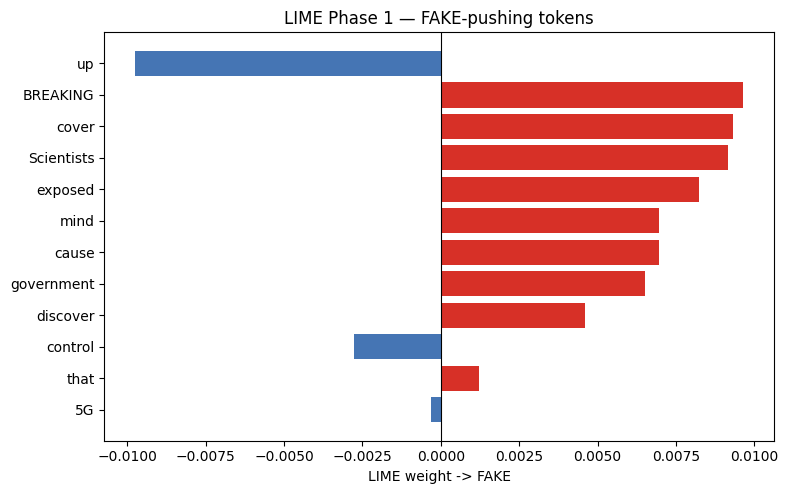

In [24]:
lime_text = "BREAKING: Scientists discover that 5G towers cause mind control — government cover-up exposed!"

# Phase 1
exp_p1 = explain_lime(lime_text, phase=1, num_features=12, num_samples=500)
plot_lime_bar(exp_p1, label_id=1, title='LIME Phase 1 — FAKE-pushing tokens')

Running LIME (phase=2, num_samples=500)...


CLS embeddings:   0%|          | 0/16 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/16 [00:00<?, ?it/s]

Phase-2 fusion:   0%|          | 0/16 [00:00<?, ?it/s]

Prediction: FAKE  |  P(REAL)=0.0011  P(FAKE)=0.9989


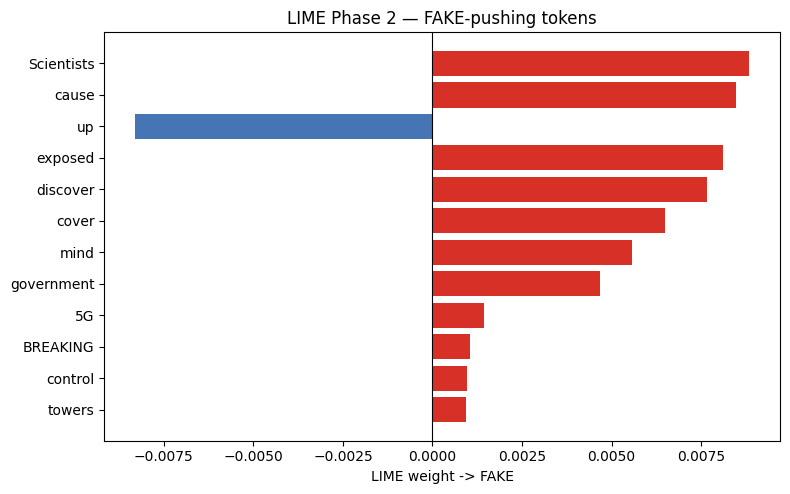

In [25]:
# Phase 2 (Fusion Head)
exp_p2 = explain_lime(lime_text, phase=2, num_features=12, num_samples=500)
plot_lime_bar(exp_p2, label_id=1, title='LIME Phase 2 — FAKE-pushing tokens')

## 13. SHAP — Fusion Head Feature Attribution

SHAP (SHapley Additive exPlanations) gives game-theoretically fair attribution to each input feature.
We apply it at two levels:

1. **Signal-level** — how much does the 768-d semantic signal contribute vs. the 3 GPT-2 stat features?
2. **Stat-feature breakdown** — which of the three stat features matters most?

> Uses `KernelExplainer` (model-agnostic) over a k-means-summarised background.

In [26]:
import shap
shap.initjs()

# Background texts — use a representative sample (50-200 texts in practice)
SHAP_BG_TEXTS = sample_texts

print('Building SHAP background...')
bg_cls  = extract_cls_embeddings(SHAP_BG_TEXTS).numpy()   # (N, 768)
bg_stat = compute_stat_features(SHAP_BG_TEXTS)            # (N, 3)
bg_stat_norm, BG_MEAN, BG_STD = normalise(bg_stat)
BG_MATRIX = np.concatenate([bg_cls, bg_stat_norm], axis=1).astype(np.float32)
print(f'Background matrix shape: {BG_MATRIX.shape}')

OpenCV bindings requires "numpy" package.
Install it via command:
    pip install numpy


Building SHAP background...


CLS embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/1 [00:00<?, ?it/s]

Background matrix shape: (2, 771)


In [27]:
def _fusion_predict_shap(X):
    """SHAP wrapper: (N, 771) -> (N, 2) probabilities."""
    X_t  = torch.tensor(X, dtype=torch.float32)
    sem  = X_t[:, :SEMANTIC_DIM].to(DEVICE)
    stat = X_t[:, SEMANTIC_DIM:].to(DEVICE)
    fusion_head.eval()
    with torch.no_grad():
        probs = torch.softmax(fusion_head(sem, stat).float(), dim=-1).cpu().numpy()
    return probs

print('Fitting KernelExplainer on background summary...')
bg_summary = shap.kmeans(BG_MATRIX, min(10, len(BG_MATRIX)))
shap_explainer = shap.KernelExplainer(_fusion_predict_shap, bg_summary)
print('SHAP KernelExplainer ready.')

Fitting KernelExplainer on background summary...
SHAP KernelExplainer ready.


In [36]:
def explain_shap_fusion(text, n_shap_samples=100):
    """
    Compute SHAP values for a single text on the Fusion Head.
    
    Returns
    -------
    shap_values : np.ndarray of shape (1, 771, n_classes)   # n_classes is usually 1 or 2
    x_instance  : np.ndarray of shape (1, 771)
    """
    cls_vec  = extract_cls_embeddings([text]).numpy()
    stat_raw = compute_stat_features([text])
    stat_n   = (stat_raw - BG_MEAN) / (BG_STD + 1e-8)
    x_inst   = np.concatenate([cls_vec, stat_n], axis=1).astype(np.float32)
    
    print(f'Computing SHAP values (nsamples={n_shap_samples})...')
    sv = shap_explainer.shap_values(x_inst, nsamples=n_shap_samples, silent=True)
    
    # Handle both cases: list (multi-class) or single array (binary with 1 output)
    if isinstance(sv, list):
        sv = np.stack(sv, axis=-1)          # (1, 771, 2)  → true 2-class
    else:
        sv = sv[..., np.newaxis]            # (1, 771) → (1, 771, 1)
    
    return sv, x_inst


def plot_shap_signal_split(shap_values, text, label_id=None):
    """Pie of semantic vs stat signal + stat feature bar chart.
    
    Safely handles both 1-output and 2-output models.
    """
    if label_id is None:
        label_id = 0
    
    n_classes = shap_values.shape[-1]
    if label_id >= n_classes:
        print(f"Warning: label_id={label_id} out of bounds (only {n_classes} class(es)). Using 0.")
        label_id = 0
    
    # Ensure we take a 1D slice
    sv_cls  = np.abs(shap_values[0, :SEMANTIC_DIM, label_id]).sum()
    sv_stat = np.abs(shap_values[0, SEMANTIC_DIM:, label_id]).sum()
    stat_sv = shap_values[0, SEMANTIC_DIM:, label_id]
    
    # CRITICAL FIX: Force stat_sv to be a flat 1D numpy array
    stat_sv = np.asarray(stat_sv).ravel()   # .ravel() flattens any (3,1) → (3,)
    
    # Recompute colours after flattening
    colours = ['#d73027' if v > 0 else '#4575b4' for v in stat_sv]

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].pie(
        [sv_cls, sv_stat],
        labels=['Semantic signal\n(CLS 768-d)', 'Statistical signal\n(GPT-2, 3-d)'],
        autopct='%1.1f%%', 
        colors=['#4575b4', '#d73027'], 
        startangle=90
    )
    title = f'Signal Attribution → {ID2LABEL.get(label_id, f"Class {label_id}")}'
    axes[0].set_title(title)

    axes[1].barh(STAT_NAMES, stat_sv, color=colours)
    axes[1].axvline(0, color='black', linewidth=0.8)
    axes[1].set_xlabel(f'SHAP value → {ID2LABEL.get(label_id, f"Class {label_id}")}')
    axes[1].set_title('GPT-2 Stat Feature Breakdown')

    fig.suptitle(f'"{text[:80]}"', fontsize=9, style='italic')
    plt.tight_layout()
    plt.show()

CLS embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/1 [00:00<?, ?it/s]

Computing SHAP values (nsamples=200)...


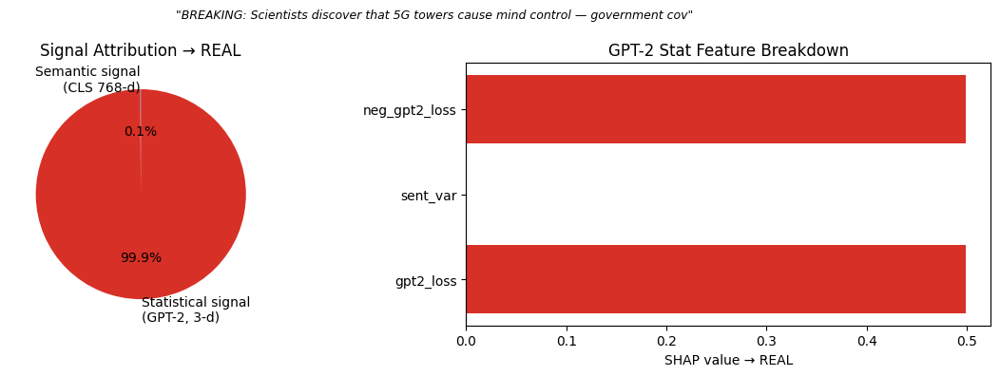

In [40]:
shap_text = "BREAKING: Scientists discover that 5G towers cause mind control — government cover-up exposed!"
sv, x_inst = explain_shap_fusion(shap_text, n_shap_samples=200)
plot_shap_signal_split(sv, shap_text,label_id=0)

SHAP per text:   0%|          | 0/2 [00:00<?, ?it/s]

CLS embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/1 [00:00<?, ?it/s]

Computing SHAP values (nsamples=300)...


CLS embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/1 [00:00<?, ?it/s]

Computing SHAP values (nsamples=300)...


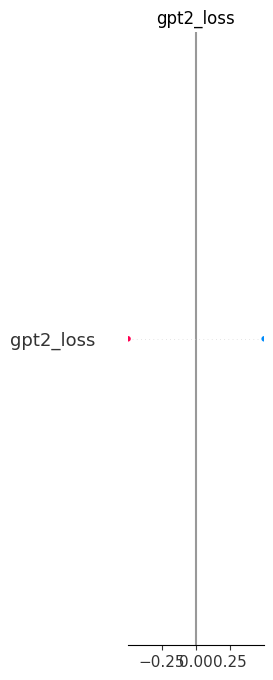

In [42]:
# Multi-sample SHAP summary plot for stat features
# Replace sample_texts with a larger set for richer plots
all_sv, all_xi = [], []
for t in tqdm(sample_texts, desc='SHAP per text'):
    sv_i, xi_i = explain_shap_fusion(t, n_shap_samples=300)
    all_sv.append(sv_i[0, SEMANTIC_DIM:, 1])
    all_xi.append(xi_i[0, SEMANTIC_DIM:])

shap.summary_plot(
    np.stack(all_sv),
    features=np.stack(all_xi),
    feature_names=STAT_NAMES,
    plot_type='dot', show=True, plot_size=(8, 3),
)

## 14. Integrated Gradients (Captum) — Token Attribution

Integrated Gradients computes the integral of gradients along a straight path from a
baseline (pad-token embedding) to the actual input embedding.
The result is a **signed attribution score per sub-word token** that satisfies the
completeness and sensitivity axioms — the most theoretically rigorous method here.

- Positive score = token pushes toward `target_class`
- Output: ranked bar chart + inline coloured HTML

In [50]:
from captum.attr import IntegratedGradients

class RobertaForIG(nn.Module):
    """Thin wrapper for Captum Integrated Gradients - Fixed version"""
    def __init__(self, model, target_class=None):
        super().__init__()
        self.model = model
        self.target_class = target_class

    def forward(self, input_embeds, attention_mask):
        outputs = self.model(inputs_embeds=input_embeds, attention_mask=attention_mask)
        logits = outputs.logits
        
        if logits.shape[-1] == 1:
            # Single logit case (e.g. sigmoid output)
            prob = torch.sigmoid(logits.squeeze(-1))
            if self.target_class == 1:
                return prob
            else:
                return 1.0 - prob
        else:
            # Standard multi-class / binary with 2 logits
            probs = torch.softmax(logits, dim=-1)
            if self.target_class is not None:
                return probs[:, self.target_class]
            else:
                return probs


def explain_integrated_gradients(text, target_class=1, n_steps=100):
    """
    Compute Integrated Gradients on RoBERTa embeddings.
    Fully fixed and clean version.
    """
    roberta.eval()
    
    # Tokenize input
    inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=512).to(DEVICE)
    input_ids = inputs["input_ids"]
    attention_mask = inputs["attention_mask"]
    
    # Get word embeddings layer
    embed_layer = roberta.roberta.embeddings.word_embeddings
    
    # Create wrapper with selected target class
    ig_wrapper = RobertaForIG(roberta, target_class=target_class).to(DEVICE)
    
    # Create baseline (all pad tokens)
    baseline_ids = torch.full_like(input_ids, tokenizer.pad_token_id)
    baseline_embeds = embed_layer(baseline_ids).detach()
    
    # Integrated Gradients
    ig = IntegratedGradients(ig_wrapper)
    
    print(f"Computing IG for target_class={target_class} ({ID2LABEL.get(target_class, 'Class '+str(target_class))}), n_steps={n_steps}...")
    
    attributions, delta = ig.attribute(
        inputs=embed_layer(input_ids).detach().requires_grad_(True),
        baselines=baseline_embeds,
        additional_forward_args=(attention_mask,),
        target=None,                 # model wrapper already returns scalar for selected target_class
        n_steps=n_steps,
        return_convergence_delta=True
    )
    
    # Extract token attributions (L2 norm across embedding dimensions)
    attr_scores = attributions.squeeze(0).norm(dim=-1).detach().cpu().numpy()
    tokens = tokenizer.convert_ids_to_tokens(input_ids.squeeze().tolist())
    
    print(f"Convergence delta: {delta.item():.6f}")
    return tokens, attr_scores


def plot_ig_bar(tokens, attr_scores, text, target_class=1, top_n=20):
    normed = attr_scores / (attr_scores.max() + 1e-10)
    idx = np.argsort(normed)[::-1][:top_n]
    t_top = [tokens[i].replace('Ġ', ' ').replace('<s>', '[CLS]').replace('</s>', '[SEP]') 
             for i in idx]
    v_top = normed[idx]
    
    cmap = plt.cm.RdYlGn_r if target_class == 1 else plt.cm.RdYlGn
    colours = [cmap(v) for v in v_top]
    
    fig, ax = plt.subplots(figsize=(10, max(5, top_n * 0.35)))
    ax.barh(t_top, v_top, color=colours)
    ax.set_xlabel('Normalised IG Attribution')
    ax.set_title(f'Integrated Gradients — Top {top_n} tokens → {ID2LABEL.get(target_class, "Class "+str(target_class))}\n"{text[:80]}..."')
    ax.invert_yaxis()
    plt.tight_layout()
    plt.show()


def render_ig_html(tokens, attr_scores, target_class=1):
    """Inline HTML visualization with color-coded tokens"""
    normed = attr_scores / (attr_scores.max() + 1e-10)
    cmap = plt.cm.Reds
    parts = [f'<p><b>Integrated Gradients Token Attribution → {ID2LABEL.get(target_class, "Class "+str(target_class))}</b></p>',
             '<p style="line-height:2.0; font-family:monospace; font-size:13px;">']
    
    for tok, score in zip(tokens, normed):
        r, g, b, _ = cmap(score)
        bg = f'rgb({int(r*255)},{int(g*255)},{int(b*255)})'
        fg = 'white' if score > 0.5 else 'black'
        dtok = tok.replace('Ġ', ' ').replace('<s>', '[CLS]').replace('</s>', '[SEP]')
        parts.append(
            f'<span style="background:{bg}; color:{fg}; padding:2px 6px; margin:1px; border-radius:3px;">{dtok}</span>'
        )
    parts.append('</p>')
    display(HTML(''.join(parts)))


print('✅ Integrated Gradients helpers (fixed) defined successfully.')

✅ Integrated Gradients helpers (fixed) defined successfully.


Computing IG for target_class=1 (FAKE), n_steps=100...
Convergence delta: -0.008467


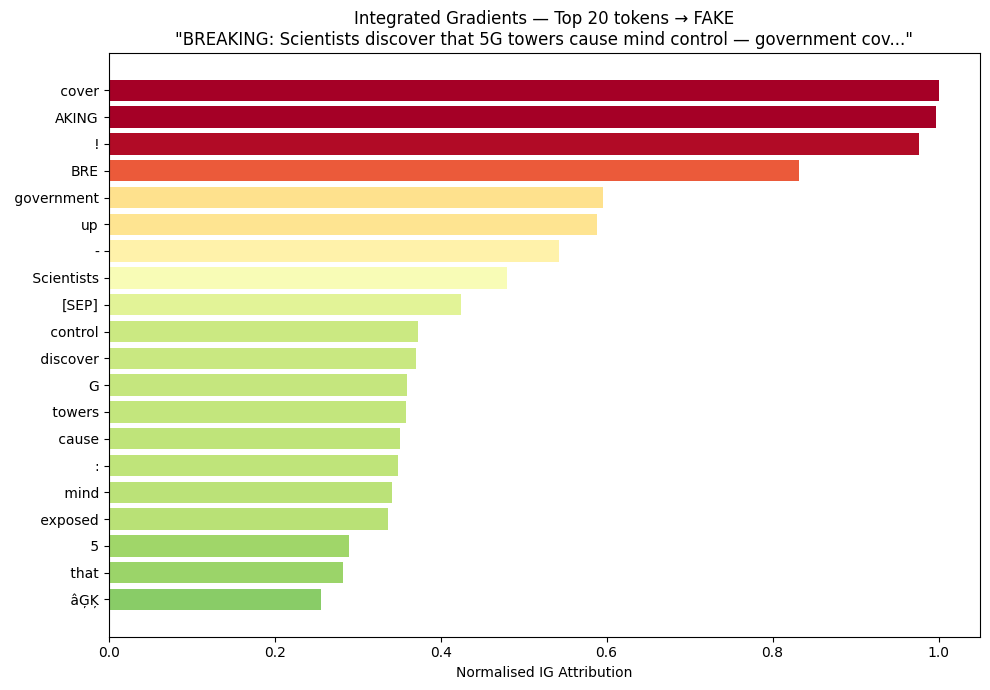

In [51]:
ig_text = "BREAKING: Scientists discover that 5G towers cause mind control — government cover-up exposed!"

tokens, attr_scores = explain_integrated_gradients(ig_text, target_class=1, n_steps=100)
plot_ig_bar(tokens, attr_scores, ig_text, target_class=1, top_n=20)
render_ig_html(tokens, attr_scores, target_class=1)


--- Attribution toward REAL ---
Computing IG for target_class=0 (REAL), n_steps=100...
Convergence delta: 0.013901


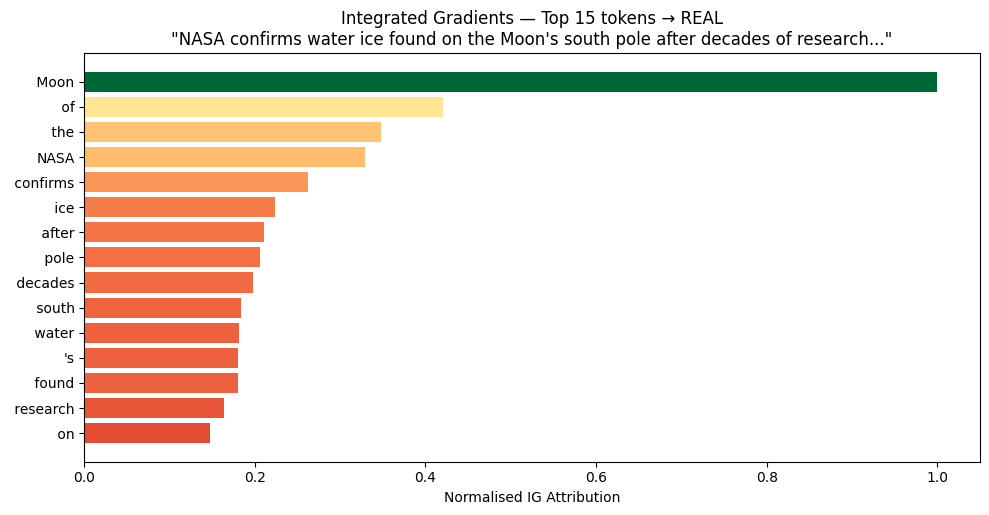


--- Attribution toward FAKE ---
Computing IG for target_class=1 (FAKE), n_steps=100...
Convergence delta: -0.013901


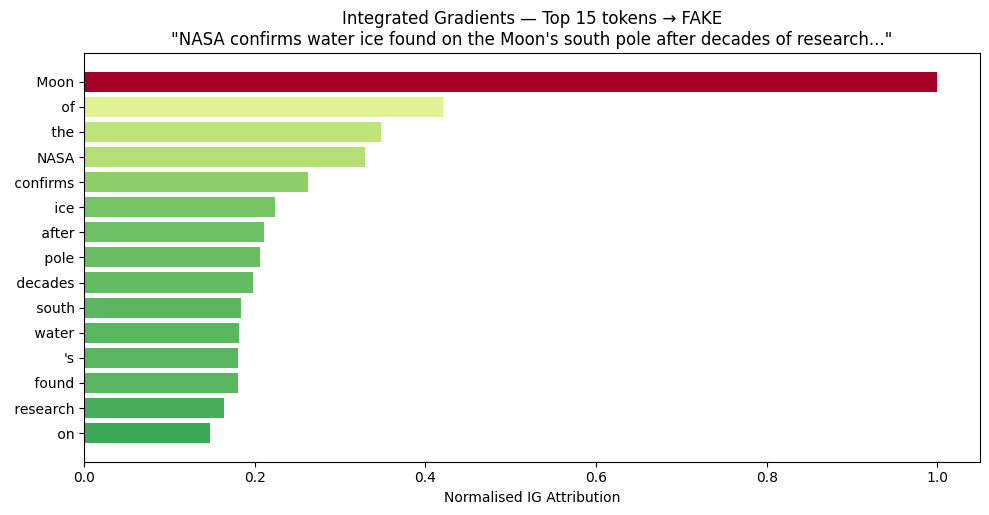

In [52]:
# Compare REAL vs FAKE attribution for a factual sentence
ig_text2 = "NASA confirms water ice found on the Moon's south pole after decades of research."
for cls_id, cls_name in [(0, 'REAL'), (1, 'FAKE')]:
    print(f'\n--- Attribution toward {cls_name} ---')
    toks, scores = explain_integrated_gradients(ig_text2, target_class=cls_id, n_steps=100)
    plot_ig_bar(toks, scores, ig_text2, target_class=cls_id, top_n=15)

## 15. Attention Visualisation

Plots the CLS token's attention weights to every other token across all heads in a selected layer.

> **Note:** Attention weights are not attributions — they don't account for value-vector magnitude.
> Use alongside IG for a more complete picture.

In [53]:
def explain_attention(text, layer_idx=-1, max_tokens=40):
    """
    Heatmap of CLS attention weights per head in a given layer.

    Parameters
    ----------
    text       : str
    layer_idx  : transformer layer to inspect (-1 = last)
    max_tokens : max tokens to display

    Returns
    -------
    display_tokens : list[str]
    mean_attn      : np.ndarray (T,) mean across heads
    """
    enc = tokenizer(text, return_tensors='pt', truncation=True,
                    max_length=MAX_LENGTH, padding=False).to(DEVICE)
    with torch.no_grad():
        out = roberta(**enc, output_attentions=True)

    attn   = out.attentions[layer_idx][0].cpu().numpy()   # (n_heads, T, T)
    tokens = tokenizer.convert_ids_to_tokens(enc['input_ids'].squeeze().tolist())

    T           = min(len(tokens), max_tokens)
    cls_attn    = attn[:, 0, :T]                          # (n_heads, T)
    disp_tokens = [t.replace('G', ' ').replace('<s>', '[CLS]').replace('</s>', '[SEP]')
                   for t in tokens[:T]]

    n_heads = cls_attn.shape[0]
    fig, ax = plt.subplots(figsize=(max(10, T * 0.40), max(4, n_heads * 0.45)))
    im = ax.imshow(cls_attn, aspect='auto', cmap='YlOrRd', vmin=0)
    ax.set_xticks(range(T))
    ax.set_xticklabels(disp_tokens, rotation=45, ha='right', fontsize=8)
    ax.set_yticks(range(n_heads))
    ax.set_yticklabels([f'Head {i}' for i in range(n_heads)], fontsize=8)
    ax.set_xlabel('Token')
    layer_lbl = f'Layer {layer_idx}' if layer_idx >= 0 else 'Last Layer'
    ax.set_title(f'RoBERTa CLS Attention — {layer_lbl}\n"{text[:80]}"')
    plt.colorbar(im, ax=ax, shrink=0.6)
    plt.tight_layout(); plt.show()

    return disp_tokens, cls_attn.mean(axis=0)


def plot_mean_head_attention(tokens, mean_attn, text):
    fig, ax = plt.subplots(figsize=(10, 3))
    colours = plt.cm.YlOrRd(mean_attn / (mean_attn.max() + 1e-10))
    ax.bar(range(len(tokens)), mean_attn, color=colours)
    ax.set_xticks(range(len(tokens)))
    ax.set_xticklabels(tokens, rotation=45, ha='right', fontsize=8)
    ax.set_ylabel('Mean Attention')
    ax.set_title(f'Mean CLS Attention (all heads)\n"{text[:80]}"')
    plt.tight_layout(); plt.show()

print('Attention visualisation helpers defined.')

Attention visualisation helpers defined.


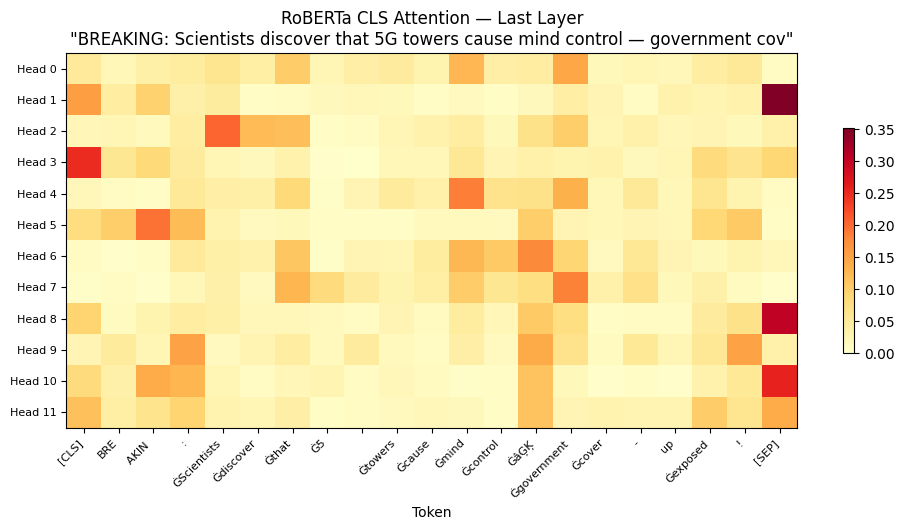

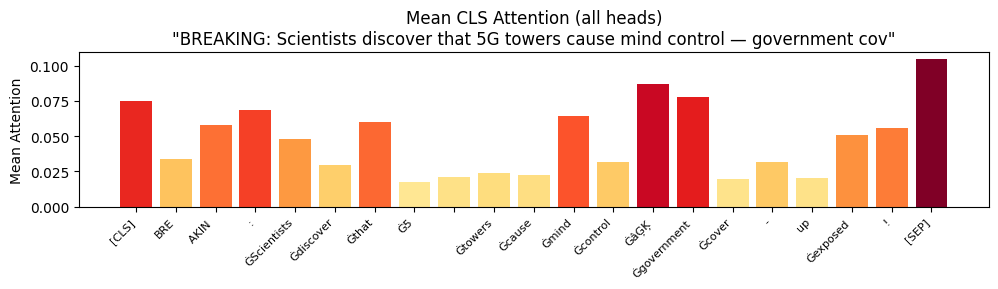

In [54]:
attn_text = "BREAKING: Scientists discover that 5G towers cause mind control — government cover-up exposed!"

disp_tokens, mean_attn = explain_attention(attn_text, layer_idx=-1, max_tokens=35)
plot_mean_head_attention(disp_tokens, mean_attn, attn_text)

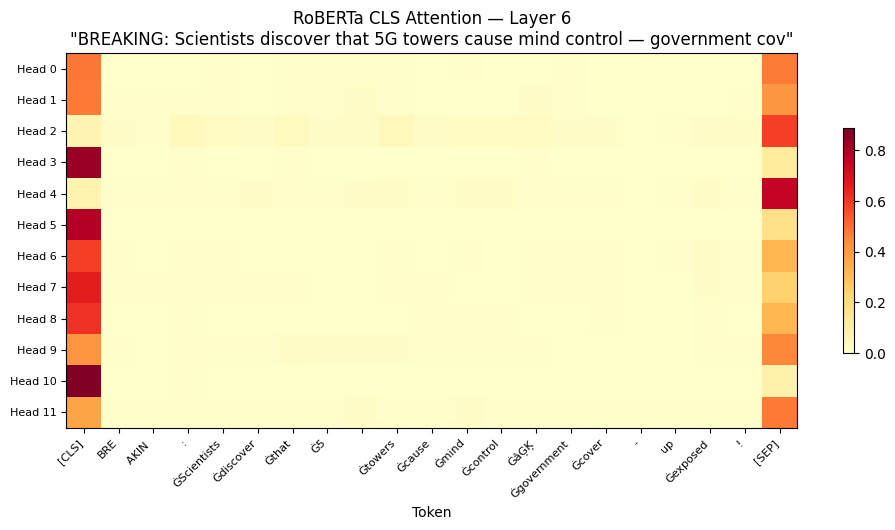

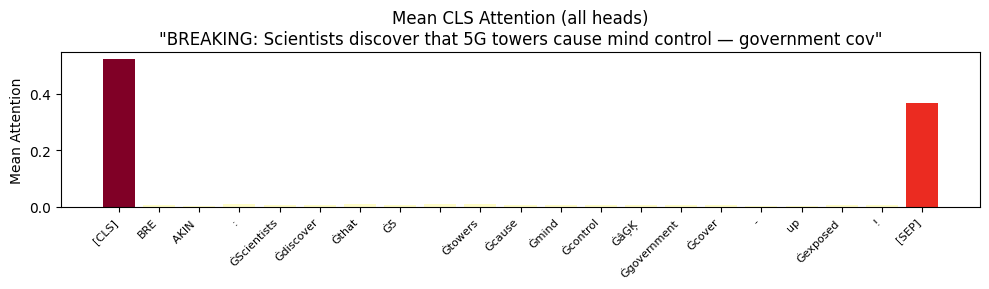

In [55]:
# Inspect mid-network layer (layer 6)
disp_mid, mean_mid = explain_attention(attn_text, layer_idx=6, max_tokens=35)
plot_mean_head_attention(disp_mid, mean_mid, attn_text + ' [Layer 6]')

## 16. All-in-One explain_all()

Runs prediction + all four methods in a single call.

In [56]:
def explain_all(
    text,
    phase=2,
    lime_samples=300,
    shap_samples=100,
    ig_steps=100,
    target_class=None,
):
    """
    Full explanation pipeline for one article.

    Parameters
    ----------
    text         : str
    phase        : 1 or 2
    lime_samples : LIME perturbation count
    shap_samples : SHAP nsamples (Phase 2 only)
    ig_steps     : IG approximation steps
    target_class : 0=REAL, 1=FAKE, None=auto (uses predicted label)
    """
    sep = '=' * 70
    print(sep)
    print(f'  TEXT : {text[:100]}')
    print(sep)

    pred_fn = predict_phase1 if phase == 1 else predict_phase2
    res     = pred_fn([text])[0]
    if target_class is None:
        target_class = res['label_id']

    print(f'  Prediction           : {format_result(res)}')
    print(f'  Explaining toward    : {ID2LABEL[target_class]}')
    print()

    print('--- LIME ' + '-'*61)
    exp = explain_lime(text, phase=phase, num_samples=lime_samples, show_html=True)
    plot_lime_bar(exp, label_id=target_class)

    if phase == 2 and fusion_head is not None:
        print('--- SHAP ' + '-'*61)
        sv, xi = explain_shap_fusion(text, n_shap_samples=shap_samples)
        plot_shap_signal_split(sv, text, label_id=target_class)
    else:
        print('(SHAP skipped — requires Phase 2 and loaded Fusion Head)')

    print('--- Integrated Gradients ' + '-'*45)
    toks, scores = explain_integrated_gradients(text, target_class=target_class, n_steps=ig_steps)
    plot_ig_bar(toks, scores, text, target_class=target_class)
    render_ig_html(toks, scores, target_class=target_class)

    print('--- Attention ' + '-'*56)
    disp_toks, mean_attn = explain_attention(text, layer_idx=-1, max_tokens=40)
    plot_mean_head_attention(disp_toks, mean_attn, text)

    print(sep)
    print('  Explanation complete.')
    print(sep)

print('explain_all() defined.')

explain_all() defined.


  TEXT : New Study Links Popular Energy Drink Ingredient to Improved Focus in Adults Over 40. A peer-reviewed


Phase-1 inference:   0%|          | 0/1 [00:00<?, ?it/s]

  Prediction           : FAKE  (confidence: 82.84%)  P(REAL)=0.1716  P(FAKE)=0.8284
  Explaining toward    : FAKE

--- LIME -------------------------------------------------------------
Running LIME (phase=1, num_samples=400)...


Phase-1 inference:   0%|          | 0/13 [00:00<?, ?it/s]

Prediction: FAKE  |  P(REAL)=0.1716  P(FAKE)=0.8284


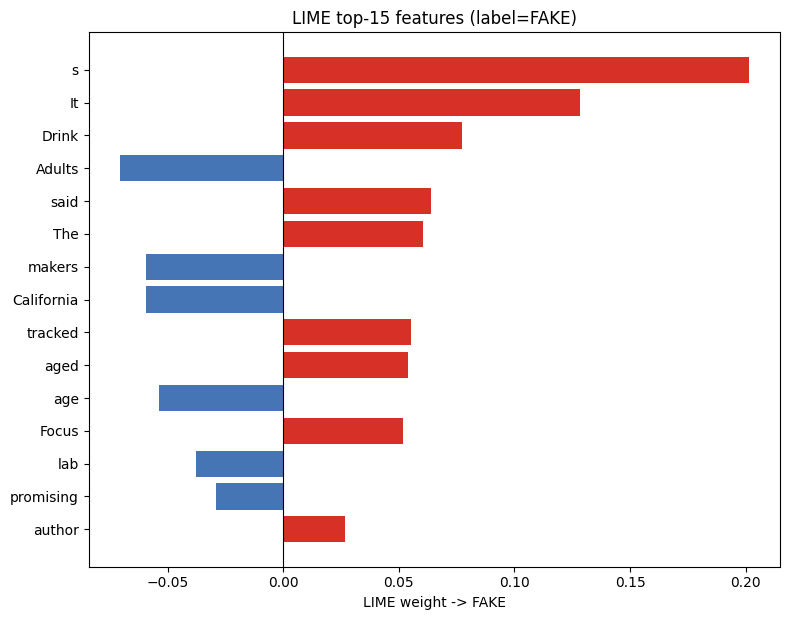

(SHAP skipped — requires Phase 2 and loaded Fusion Head)
--- Integrated Gradients ---------------------------------------------
Computing IG for target_class=1 (FAKE), n_steps=100...
Convergence delta: -0.235833


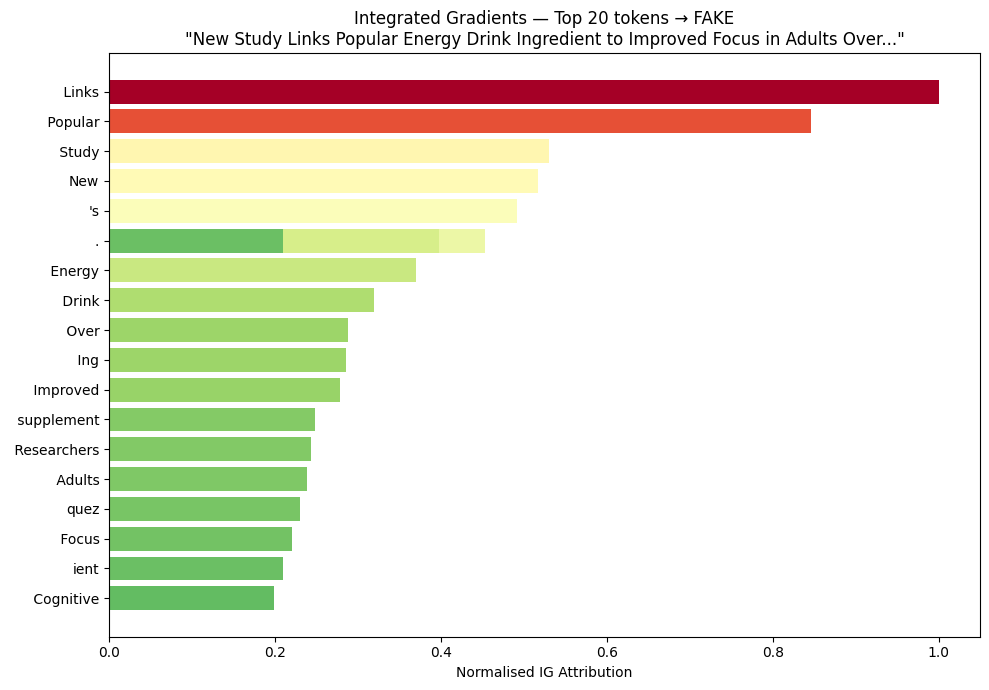

--- Attention --------------------------------------------------------


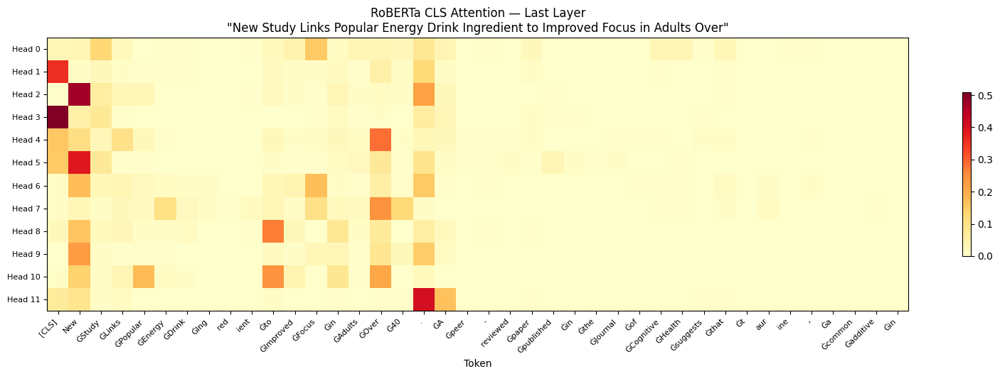

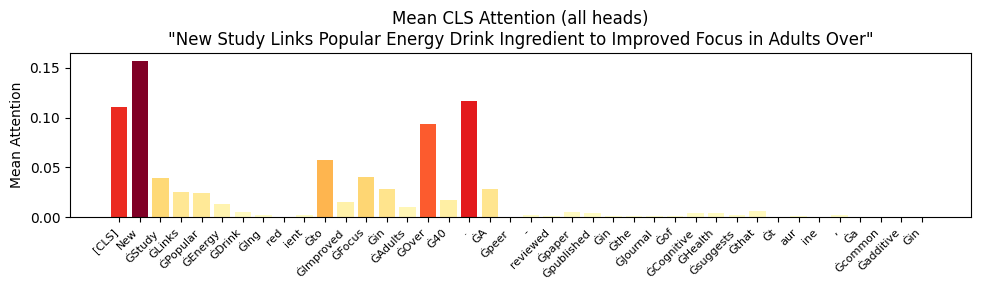

  Explanation complete.


In [69]:
# Full pipeline on a fake-news article
explain_all(
    text="New Study Links Popular Energy Drink Ingredient to Improved Focus in Adults Over 40. A peer-reviewed paper published in the Journal of Cognitive Health suggests that taurine, a common additive in energy drinks, may enhance cognitive performance by up to 25% in middle-aged adults when consumed in moderate doses. Researchers at a university lab in California tracked 500 participants over six months. It's not a miracle cure, but the data is promising for those experiencing age-related mental fatigue, said lead author Dr. Elena Vasquez. The findings have sparked interest among supplement makers, though health regulators caution against overconsumption.",
    phase=1,
    lime_samples=400,
    shap_samples=100,
    ig_steps=100,
)

  TEXT : New Study Links Popular Energy Drink Ingredient to Improved Focus in Adults Over 40. A peer-reviewed


CLS embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/1 [00:00<?, ?it/s]

Phase-2 fusion:   0%|          | 0/1 [00:00<?, ?it/s]

  Prediction           : FAKE  (confidence: 97.95%)  P(REAL)=0.0205  P(FAKE)=0.9795
  Explaining toward    : FAKE

--- LIME -------------------------------------------------------------
Running LIME (phase=2, num_samples=400)...


CLS embeddings:   0%|          | 0/13 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/13 [00:00<?, ?it/s]

Phase-2 fusion:   0%|          | 0/13 [00:00<?, ?it/s]

Prediction: FAKE  |  P(REAL)=0.0178  P(FAKE)=0.9822


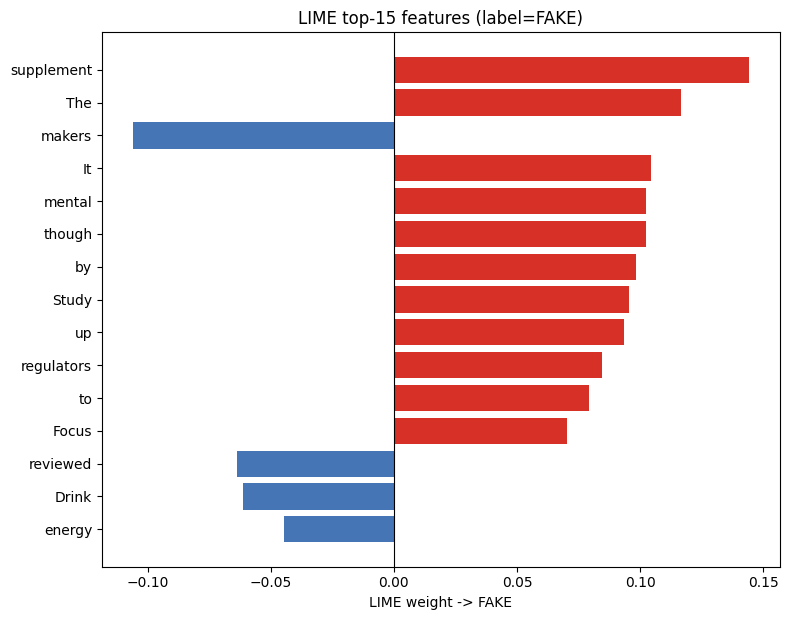

--- SHAP -------------------------------------------------------------


CLS embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/1 [00:00<?, ?it/s]

Computing SHAP values (nsamples=100)...


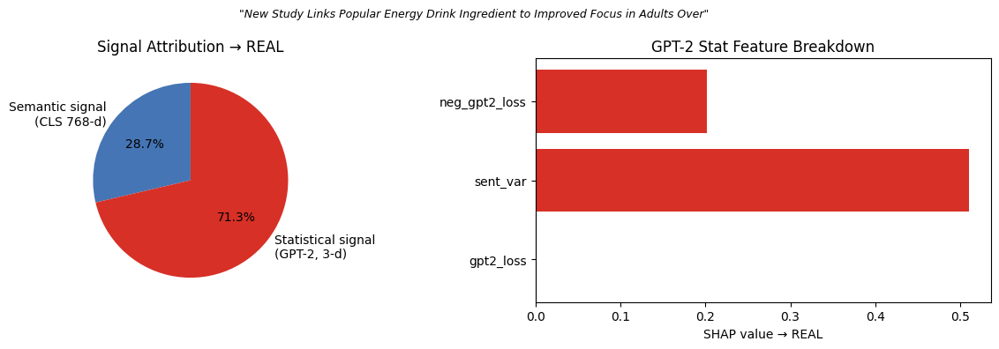

--- Integrated Gradients ---------------------------------------------
Computing IG for target_class=1 (FAKE), n_steps=100...
Convergence delta: -0.235833


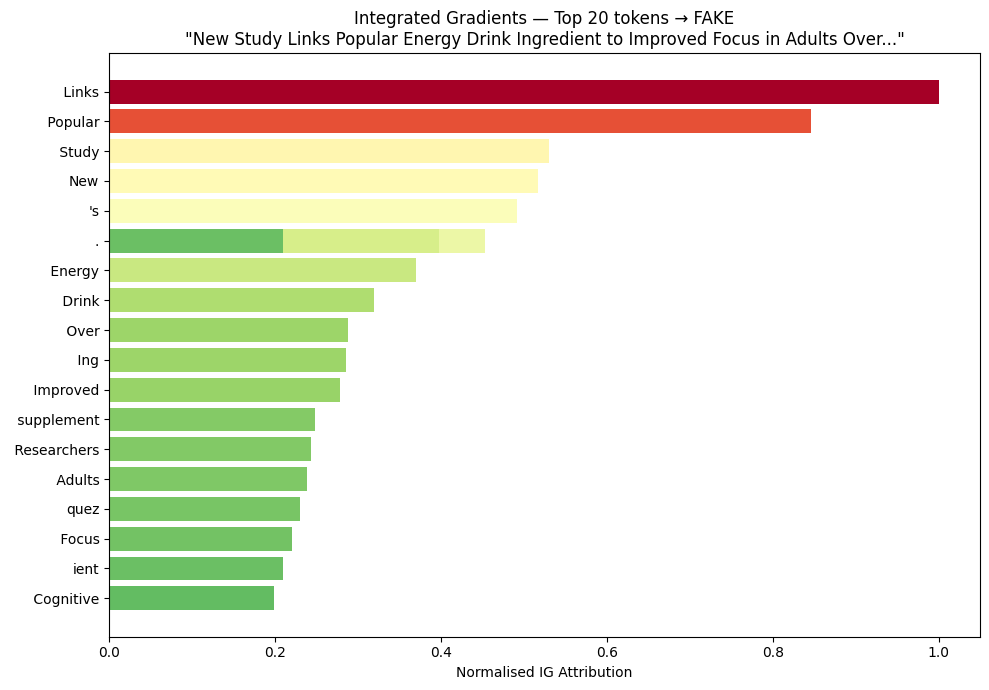

--- Attention --------------------------------------------------------


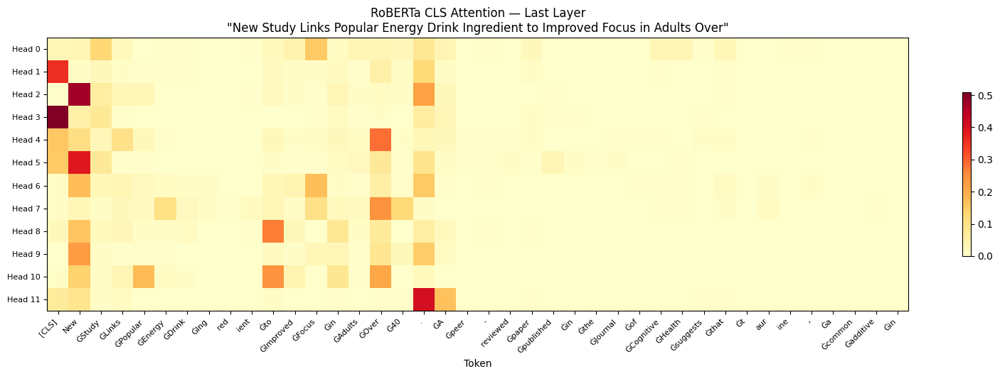

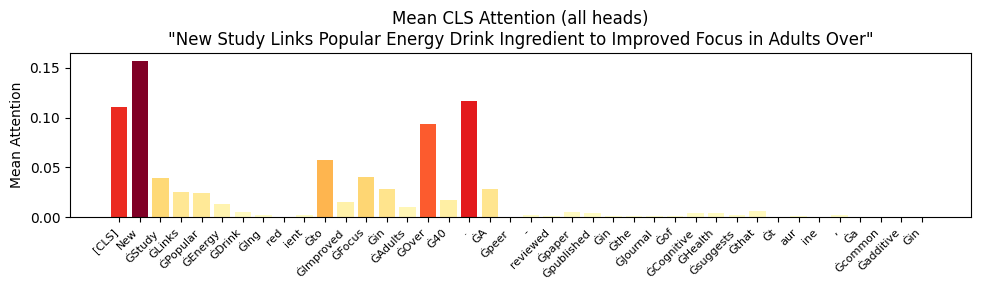

  Explanation complete.


In [70]:
# Full pipeline on a fake-news article
explain_all(
    text="New Study Links Popular Energy Drink Ingredient to Improved Focus in Adults Over 40. A peer-reviewed paper published in the Journal of Cognitive Health suggests that taurine, a common additive in energy drinks, may enhance cognitive performance by up to 25% in middle-aged adults when consumed in moderate doses. Researchers at a university lab in California tracked 500 participants over six months. It's not a miracle cure, but the data is promising for those experiencing age-related mental fatigue, said lead author Dr. Elena Vasquez. The findings have sparked interest among supplement makers, though health regulators caution against overconsumption.",
    phase=2,
    lime_samples=400,
    shap_samples=100,
    ig_steps=100,
)

  TEXT : Iran-Israel war Trump delays Strait of Hormuz deadline as Wall Street has biggest loss of war.U.S. P


Phase-1 inference:   0%|          | 0/1 [00:00<?, ?it/s]

  Prediction           : FAKE  (confidence: 95.79%)  P(REAL)=0.0421  P(FAKE)=0.9579
  Explaining toward    : FAKE

--- LIME -------------------------------------------------------------
Running LIME (phase=1, num_samples=400)...


Phase-1 inference:   0%|          | 0/13 [00:00<?, ?it/s]

Prediction: FAKE  |  P(REAL)=0.0421  P(FAKE)=0.9579


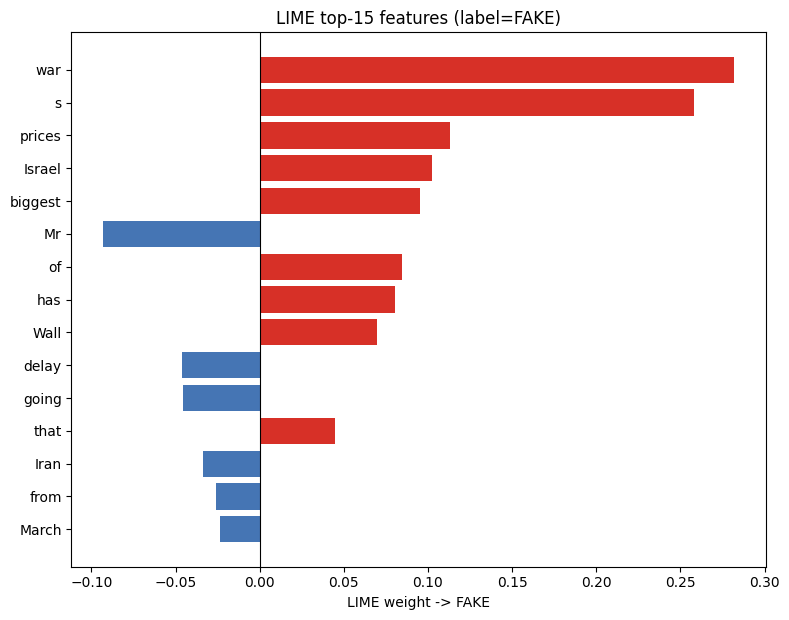

(SHAP skipped — requires Phase 2 and loaded Fusion Head)
--- Integrated Gradients ---------------------------------------------
Computing IG for target_class=1 (FAKE), n_steps=100...
Convergence delta: -0.007721


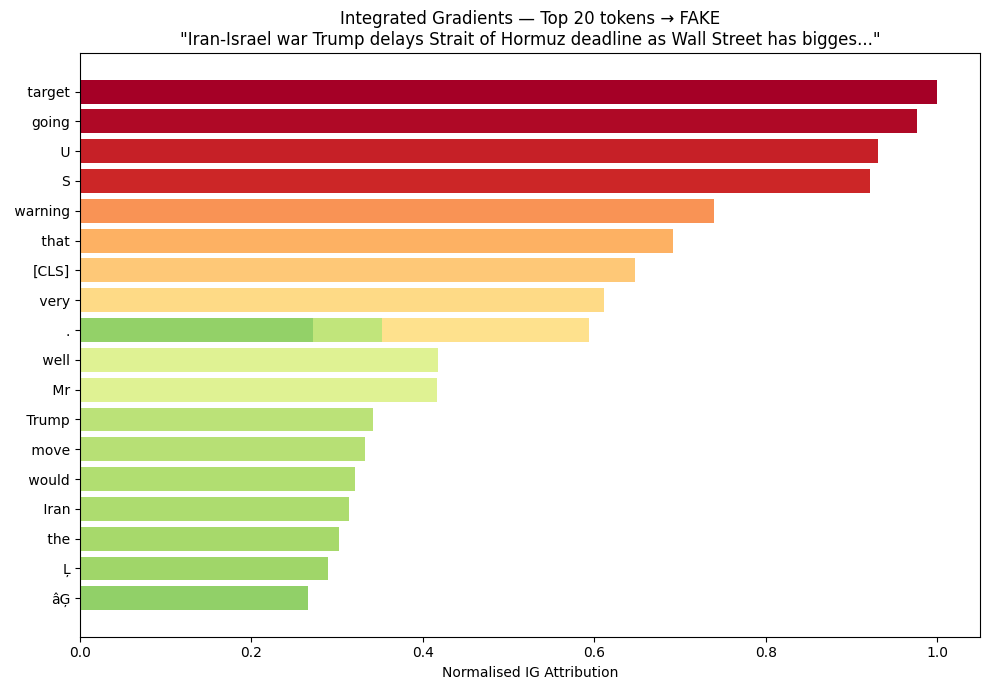

--- Attention --------------------------------------------------------


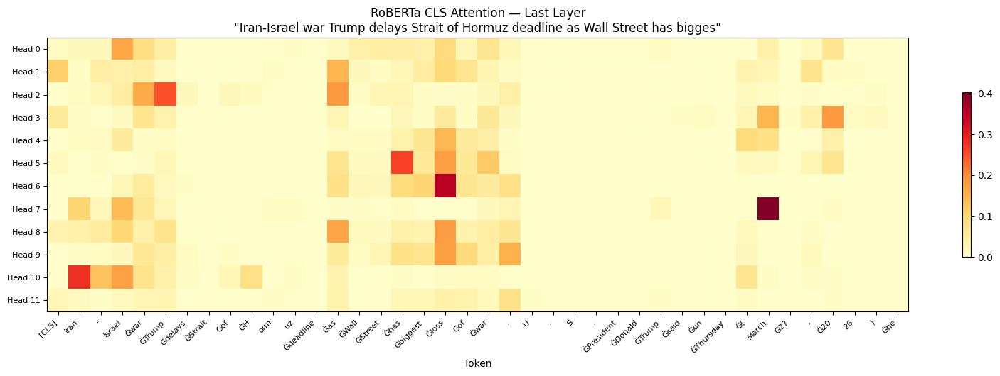

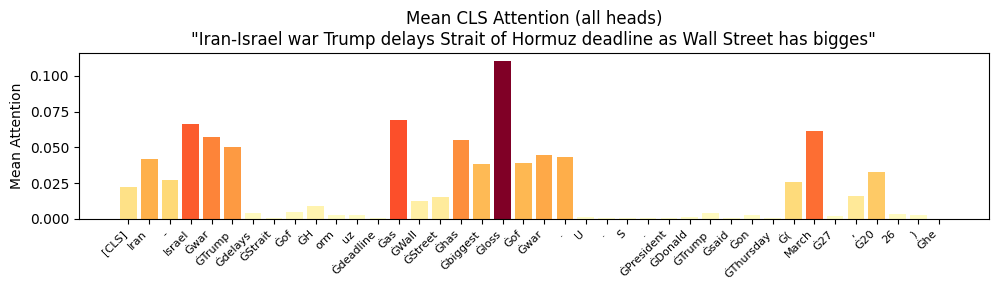

  Explanation complete.


In [65]:
# Full pipeline on a real news article
explain_all(
    text="Iran-Israel war Trump delays Strait of Hormuz deadline as Wall Street has biggest loss of war.U.S. President Donald Trump said on Thursday (March 27, 2026) he will delay a threatened strike on Iran’s energy infrastructure and extend his deadline for Tehran to reopen the Strait of Hormuz until April 6, saying talks to end the war are “going very well.” The move marks a pullback from Mr. Trump’s earlier warning that the U.S. would target Iran’s energy plants if the crucial shipping lane remained closed. Iran has threatened to retaliate against regional infrastructure, including desalination facilities, if the U.S. follows through.Mr. Trump’s announcement on social media came after U.S. stocks fell sharply and oil prices rose, as doubt took over again on Wall Street about a possible end to the war.",
    phase=1,
    lime_samples=400,
    shap_samples=100,
    ig_steps=100,
)

  TEXT : The government has mandated that cooking gas LPG supply to households will be discontinued if consum


Phase-1 inference:   0%|          | 0/1 [00:00<?, ?it/s]

  Prediction           : REAL  (confidence: 88.60%)  P(REAL)=0.8860  P(FAKE)=0.1140
  Explaining toward    : REAL

--- LIME -------------------------------------------------------------
Running LIME (phase=1, num_samples=400)...


Phase-1 inference:   0%|          | 0/13 [00:00<?, ?it/s]

Prediction: REAL  |  P(REAL)=0.8891  P(FAKE)=0.1109


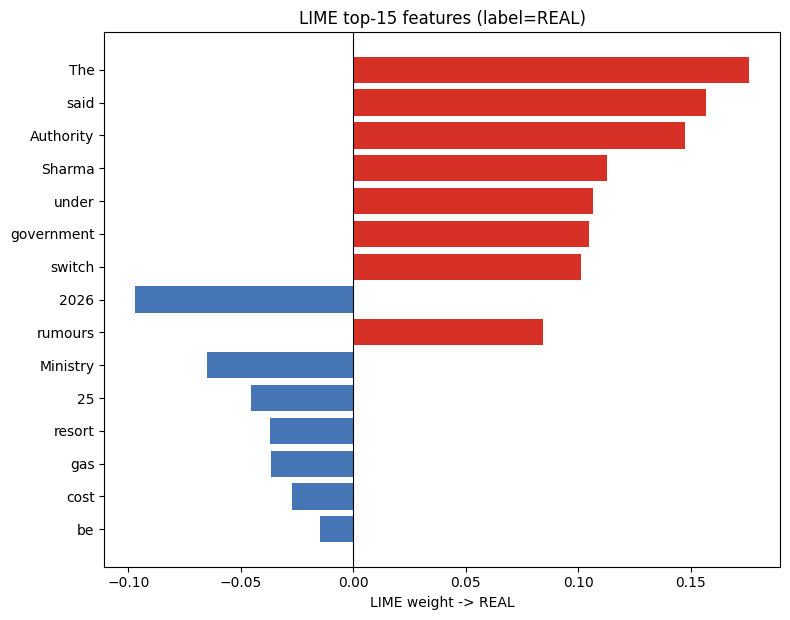

(SHAP skipped — requires Phase 2 and loaded Fusion Head)
--- Integrated Gradients ---------------------------------------------
Computing IG for target_class=0 (REAL), n_steps=100...
Convergence delta: 0.023942


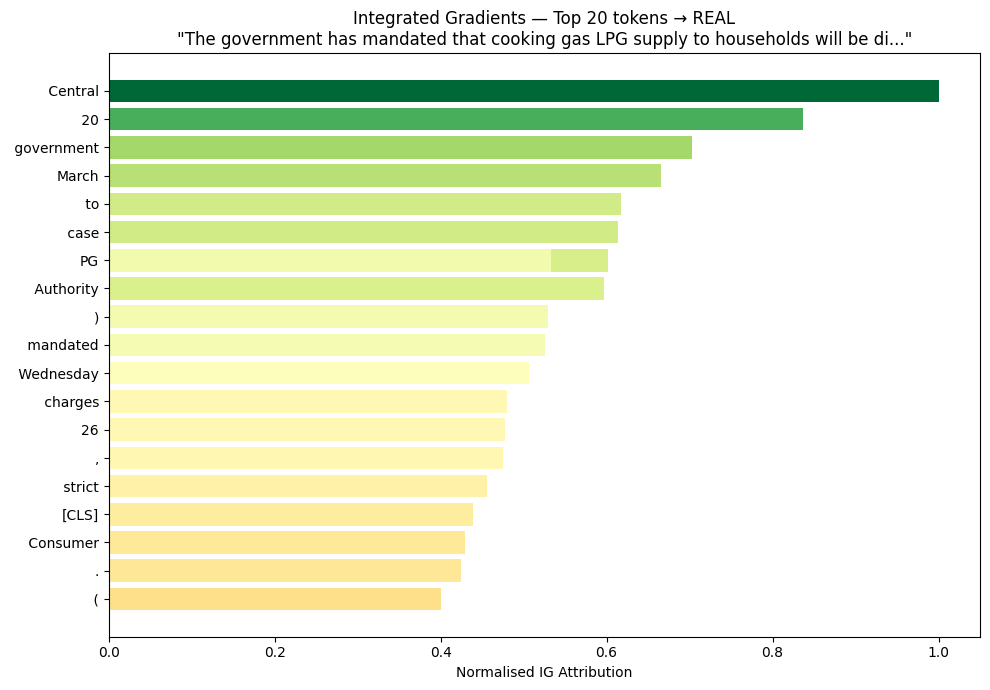

--- Attention --------------------------------------------------------


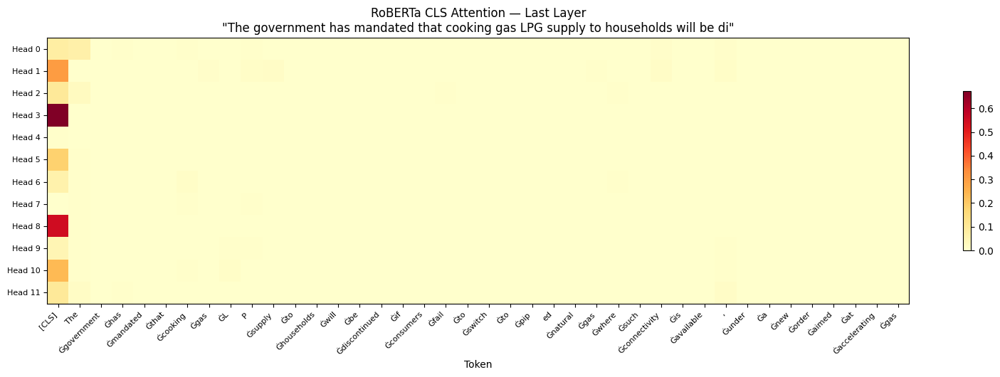

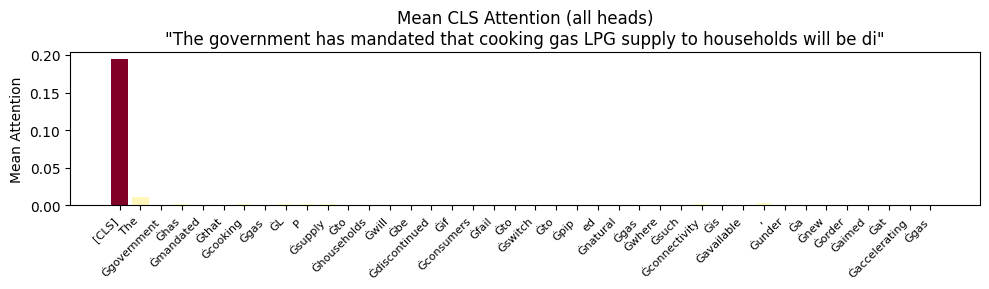

  Explanation complete.


In [68]:
# Full pipeline on a real news article
explain_all(
    text="The government has mandated that cooking gas LPG supply to households will be discontinued if consumers fail to switch to piped natural gas where such connectivity is available, under a new order aimed at accelerating gas network expansion and reducing reliance on a single fuel.The Central Consumer Protection Authority on Wednesday (March 25, 2026) directed hotels and restaurants not to levy additional charges, such as ‘LPG charges’ and ‘fuel cost recovery’, on consumers, as these tantamount to unfair trade practices and strict action will be taken in case of violation.The government said there is no shortage of petrol, diesel or LPG in the country, and urged citizens not to believe rumours circulating on social media or resort to panic buying. Sujata Sharma, Joint Secretary in the Ministry of Petroleum and Natural Gas, said all refineries are operating at high capacity with “adequate crude inventories”, while “sufficient stocks of petrol and diesel are being maintained” and retail outlets are functioning normally nationwide.",
    phase=1,
    lime_samples=400,
    shap_samples=100,
    ig_steps=100,
)

  TEXT : The government has mandated that cooking gas LPG supply to households will be discontinued if consum


CLS embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/1 [00:00<?, ?it/s]

Phase-2 fusion:   0%|          | 0/1 [00:00<?, ?it/s]

  Prediction           : REAL  (confidence: 98.14%)  P(REAL)=0.9814  P(FAKE)=0.0186
  Explaining toward    : REAL

--- LIME -------------------------------------------------------------
Running LIME (phase=2, num_samples=400)...


CLS embeddings:   0%|          | 0/13 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/13 [00:00<?, ?it/s]

Phase-2 fusion:   0%|          | 0/13 [00:00<?, ?it/s]

Prediction: REAL  |  P(REAL)=0.9809  P(FAKE)=0.0191


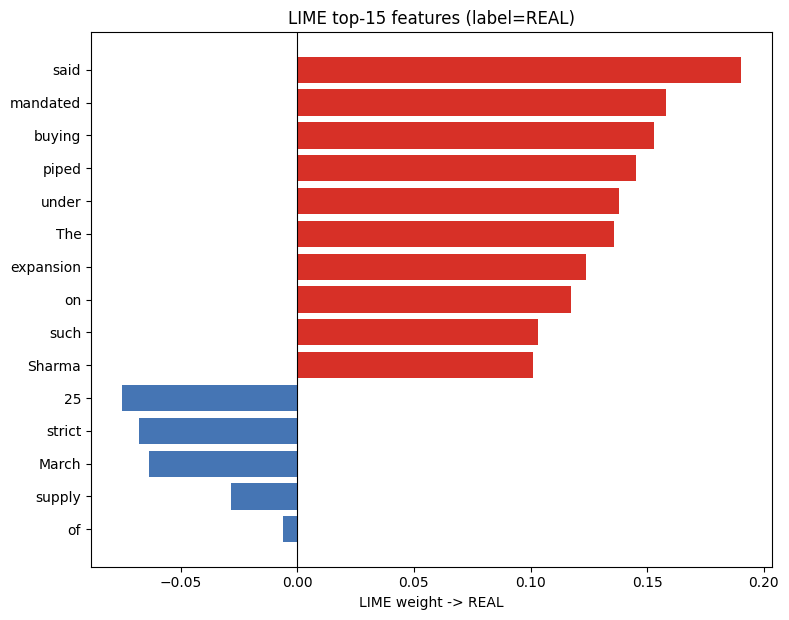

--- SHAP -------------------------------------------------------------


CLS embeddings:   0%|          | 0/1 [00:00<?, ?it/s]

GPT-2 stat features:   0%|          | 0/1 [00:00<?, ?it/s]

Computing SHAP values (nsamples=100)...


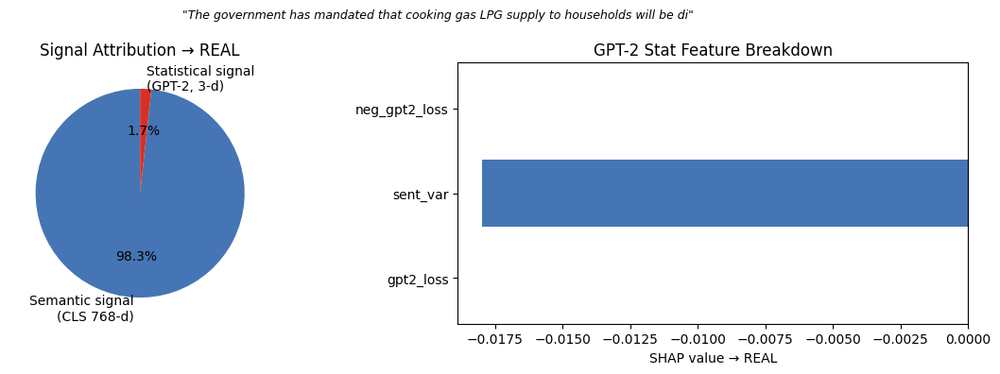

--- Integrated Gradients ---------------------------------------------
Computing IG for target_class=0 (REAL), n_steps=100...
Convergence delta: 0.023942


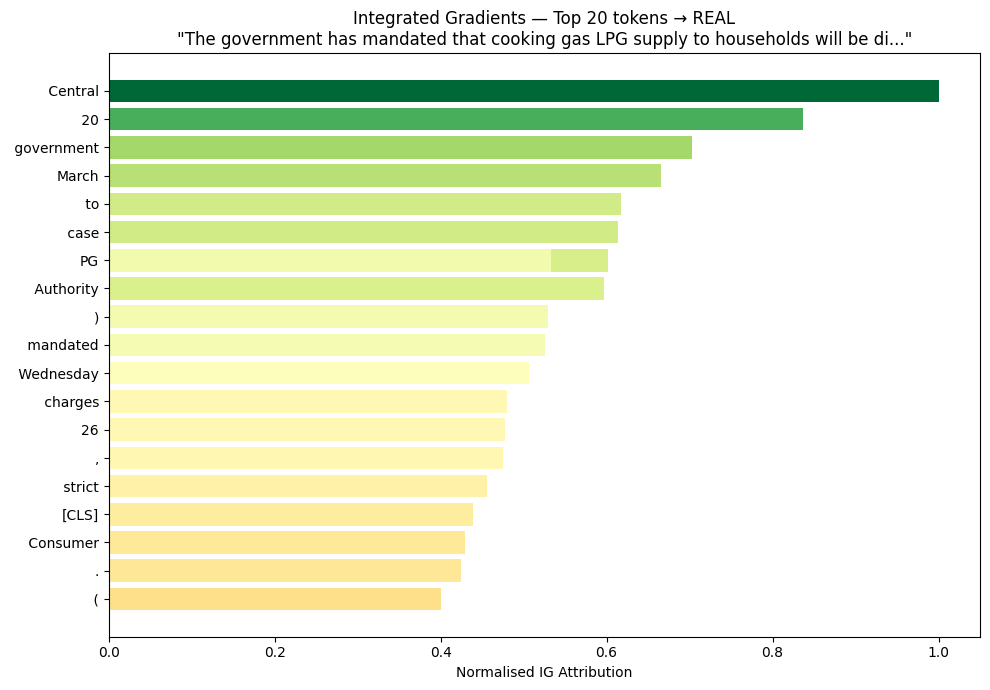

--- Attention --------------------------------------------------------


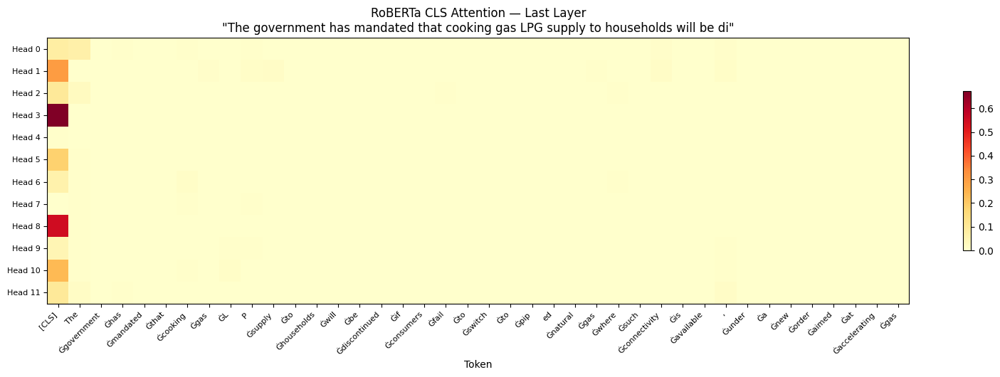

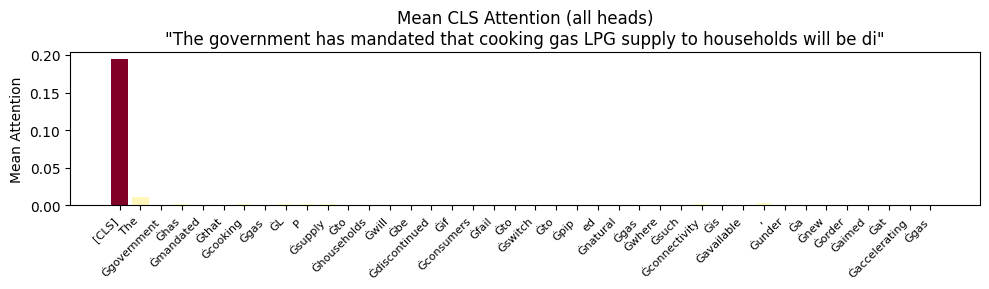

  Explanation complete.


In [67]:
# Full pipeline on a real news article
explain_all(
    text="The government has mandated that cooking gas LPG supply to households will be discontinued if consumers fail to switch to piped natural gas where such connectivity is available, under a new order aimed at accelerating gas network expansion and reducing reliance on a single fuel.The Central Consumer Protection Authority on Wednesday (March 25, 2026) directed hotels and restaurants not to levy additional charges, such as ‘LPG charges’ and ‘fuel cost recovery’, on consumers, as these tantamount to unfair trade practices and strict action will be taken in case of violation.The government said there is no shortage of petrol, diesel or LPG in the country, and urged citizens not to believe rumours circulating on social media or resort to panic buying. Sujata Sharma, Joint Secretary in the Ministry of Petroleum and Natural Gas, said all refineries are operating at high capacity with “adequate crude inventories”, while “sufficient stocks of petrol and diesel are being maintained” and retail outlets are functioning normally nationwide.",
    phase=2,
    lime_samples=400,
    shap_samples=100,
    ig_steps=100,
)

---
## Summary

### Inference
| Function | Phase | Description |
|---|---|---|
| `predict_phase1(texts)` | 1 | RoBERTa-only |
| `predict_phase2(texts)` | 2 | Fusion Head (RoBERTa + GPT-2) |
| `evaluate(texts, labels, phase)` | 1/2 | Metrics + classification report |

### Explainability
| Function | Method | Granularity | Phase |
|---|---|---|---|
| `explain_lime(text, phase)` | LIME | Word-level | 1 or 2 |
| `explain_shap_fusion(text)` | SHAP | Semantic vs stat signal | 2 only |
| `explain_integrated_gradients(text)` | Integrated Gradients | Sub-word token | 1 |
| `explain_attention(text, layer_idx)` | Attention heatmap | Per-head + mean | 1 |
| `explain_all(text, phase)` | All four | One-shot full explanation | 1 or 2 |